# scRNA-seq analysis using ScanPy for CellRanger output
**Authorship:** Adam Klie (last updated: 08/03/2023)<br>
***
**Description:** This notebook preprocesses the scRNA-seq from CellRanger filtered output
***

# Set-up

In [1]:
# Imports
import os
import sys
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Scanpy
import scanpy as sc
import scanpy.external as sce
sc.set_figure_params(vector_friendly=False, dpi_save=300, transparent=True, color_map='viridis')
sc.settings.verbosity = 3
random_state = 13

# Make the plots prettier
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]
plt.rcParams['lines.linewidth'] = 0.1
sns.set_context('paper')

In [2]:
# Compute environment and versions
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("scanpy version: {}".format(sc.__version__))
print("seaborn version: {}".format(sns.__version__))

Python version: 3.8.13 | packaged by conda-forge | (default, Mar 25 2022, 06:04:18) 
[GCC 10.3.0]
pandas version: 1.4.4
numpy version: 1.24.4
scanpy version: 1.9.3
seaborn version: 0.11.2


In [3]:
# Paths
input_h5_path = "/cellar/users/aklie/data/datasets/Zhu2023_sc-islet_scRNA-seq/processed/24Oct23/cellranger/H1-D11/outs/filtered_feature_bc_matrix.h5"

# Load AnnData object

In [4]:
# Load using scanpy
adata = sc.read_10x_h5(input_h5_path)
adata.var_names_make_unique()
adata

reading /cellar/users/aklie/data/datasets/Zhu2023_sc-islet_scRNA-seq/processed/24Oct23/cellranger/H1-D11/outs/filtered_feature_bc_matrix.h5
 (0:00:03)


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 12179 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

# QC

In [5]:
# Calculate a set basic QCs such as number of observed genes and mitochondrial gene fraction
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

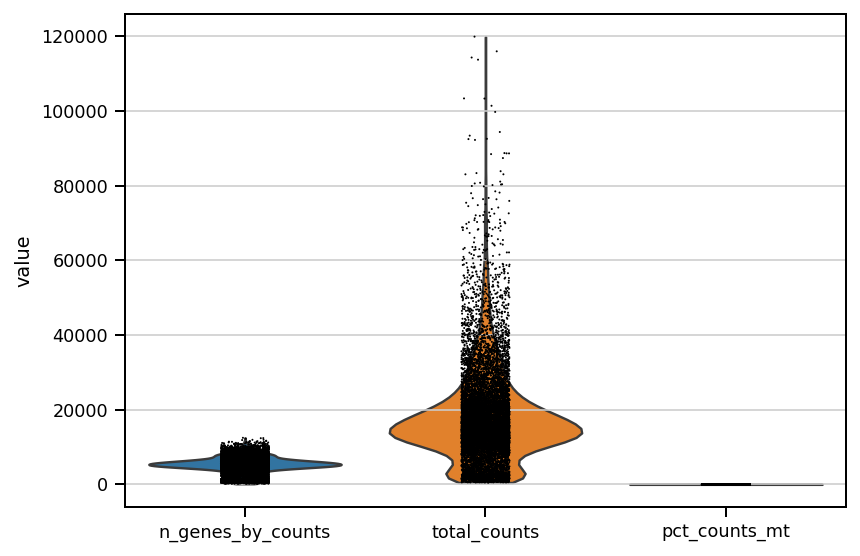

In [6]:
# Classic 3 violin plots using scanpy metrics
with plt.rc_context():
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'])
    #plt.savefig(output_path.replace(".h5ad", "_scanpy_qc_violin.pdf"))

## Doublet detection
Use scrublet to perform doublet detection. Takes around 5 minutes to run on this dataset. I let scrublet decide on a doublet score threshold here.

In [7]:
# Run the doublet detection algorithm from scrublet
sce.pp.scrublet(
    adata,
    adata_sim=None,
    random_state=random_state
)

Running Scrublet
filtered out 7761 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 8.9%
Estimated detectable doublet fraction = 50.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 17.7%
    Scrublet finished (0:00:52)


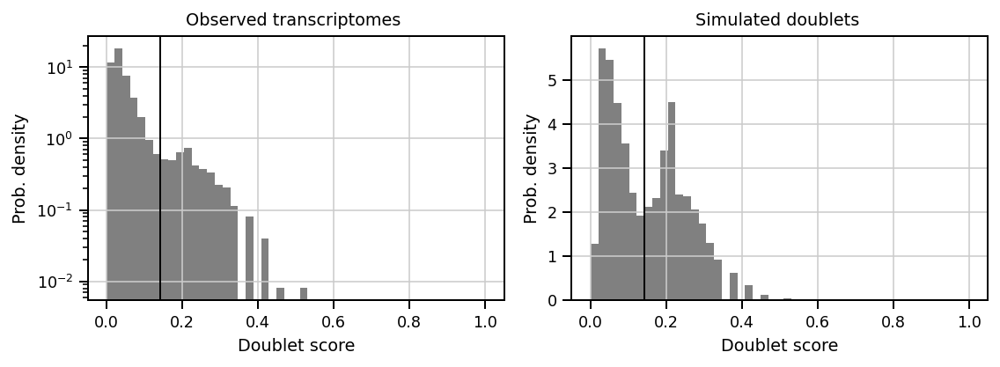

In [8]:
# Plot the doublet score distribution against simulated cells
with plt.rc_context():
    sce.pl.scrublet_score_distribution(adata, show=False)
    #plt.savefig(output_path.replace(".h5ad", "_scrublet_score_distribution.pdf"), bbox_inches="tight")

# Filtering
Actually filter cells based on QC

In [9]:
# Generates a nice interactive filtering plot to play with thresholds and see how that effects cells passing QC
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)
        
def h(lo_counts=500, hi_counts=20000, genes=300, mito=25, doublet_score=0.2):
    conditions = [
        (adata.obs['doublet_score'] > doublet_score),
        (adata.obs['total_counts'] < lo_counts),
        (adata.obs['total_counts'] > hi_counts),
        (adata.obs['n_genes_by_counts'] < genes),
        (adata.obs['pct_counts_mt'] > mito),
        ((adata.obs['doublet_score'] <= doublet_score) & (adata.obs['total_counts'] >= lo_counts) & (adata.obs['total_counts'] <= hi_counts) & (adata.obs['n_genes_by_counts'] >= genes) & adata.obs['pct_counts_mt'] <= mito)
    ]
    values = ['Doublet', 'Low_nFeature', 'High_nFeature', 'Low_ngenes', 'High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')
    new_df1 = pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p = sns.barplot(x='index', y='QC', data=new_df1, color='sandybrown')
    show_values(p)

In [12]:
interactive_plot = interactive(h, lo_counts=(0, 2000, 20), hi_counts=(0, 50000, 200), genes=(0, 2000,20), mito=(0, 100, 1), doublet_score=(0, 1, 0.01))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=500, description='lo_counts', max=2000, step=20), IntSlider(value=20000,…

In [13]:
# Check the numbers of cells filtered out by the above function
qc_series = adata.obs["QC"].value_counts()
#qc_series.to_csv(output_path.replace(".h5ad", "_qc_series.csv"))
qc_series

Passing          7691
High_nFeature    3117
High_MT           687
Doublet           633
Low_ngenes         51
Name: QC, dtype: int64

In [16]:
# Now actually filter the data based on the QC metrics
adata_filtered = adata[adata.obs['QC'] == 'Passing']
adata_filtered

View of AnnData object with n_obs × n_vars = 7691 × 36601
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

# Normalization

In [19]:
# Keep raw cont data before log transformation
adata_filtered.raw = adata_filtered
adata_filtered.layers["counts"] = adata_filtered.raw.X.copy()

In [20]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_total(adata_filtered, target_sum=1e4)
sc.pp.log1p(adata_filtered)

normalizing counts per cell
    finished (0:00:00)


In [24]:
# Add log normalized counts to adata_filtered layers
adata_filtered.layers["log_counts"] = adata_filtered.X
adata_filtered.X[:25, :25].todense()

matrix([[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.4547871 ,
         0.        , 0.4547871 , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.4547871 ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        ,

# Cell cycle scoring
Will add in the score as metadata for plotting later

In [25]:
# From Regev paper, wonder if this needs updating
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']
cell_cycle_genes = s_genes + g2m_genes
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [26]:
# Score cells based on these genes, might be useful later
sc.tl.score_genes_cell_cycle(adata_filtered, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    384 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    429 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


# Highly variable genes

In [27]:
# Select top 3000 highly-variable genes
sc.pp.highly_variable_genes(adata_filtered, flavor='seurat_v3', n_top_genes=3000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


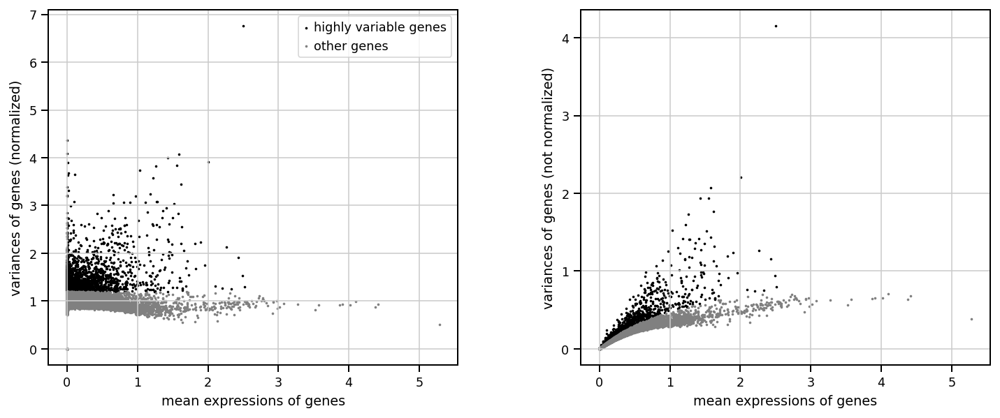

In [28]:
# Plot the highly variable genes
with plt.rc_context():
    sc.pl.highly_variable_genes(adata_filtered, show=False)
    #plt.savefig(output_path.replace(".h5ad", "_highly_variable_genes.pdf"), dpi=300)

In [29]:
# Subset the genes
adata_variable = adata_filtered[:, adata_filtered.var['highly_variable']]

In [30]:
# Check it
adata_variable

View of AnnData object with n_obs × n_vars = 7691 × 3000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'scrublet', 'log1p', 'hvg'
    layers: 'raw_counts', 'counts', 'log_counts'

# PCA

In [31]:
# Not sure if this is a good thing to do, see it sometimes and not others (PCA auto centers)
sc.pp.scale(adata_variable, max_value=10)

/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [32]:
# PCA
sc.tl.pca(adata_variable, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


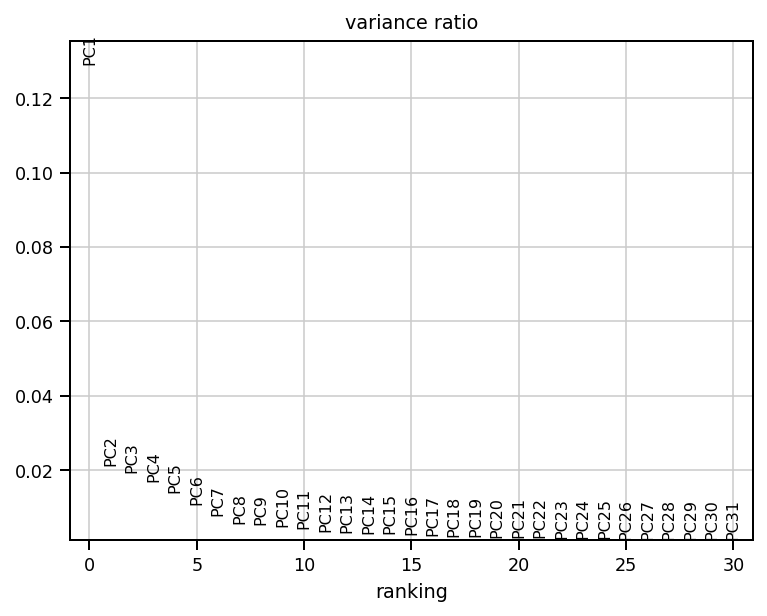

In [33]:
# Check the variance explained by each pc, on log scale
with plt.rc_context():
    sc.pl.pca_variance_ratio(adata_variable, log=False, show=False)
    #plt.savefig(output_path.replace(".h5ad", "_pca_variance_ratio.pdf"))

In [34]:
# Create a new column in the adata_variable.obs dataframe that contains the log of the total counts for each cell, for plotting
adata_variable.obs['log_counts'] = np.log(adata_variable.obs['total_counts'])

In [35]:
# spearman correlation between technical covariates and pcs
from scipy.stats import spearmanr
corr_dict = {}
pval_dict = {}
for covariate in ["total_counts", "total_counts_mt", "pct_counts_mt", "doublet_score", "S_score", "G2M_score"]:
    corr_dict[covariate] = []
    pval_dict[covariate] = []
    for PC in range(0, 10):
        spearman_result = spearmanr(adata_variable.obs[covariate], adata_variable.obsm["X_pca"][:, PC])
        corr_dict[covariate].append(spearman_result[0])
        pval_dict[covariate].append(spearman_result[1])
corr_df = pd.DataFrame(corr_dict)
corr_df.index = ["PC" + str(i) for i in range(1, 11)]
pval_df = pd.DataFrame(pval_dict)
pval_df.index = ["PC" + str(i) for i in range(1, 11)]

<Axes: >

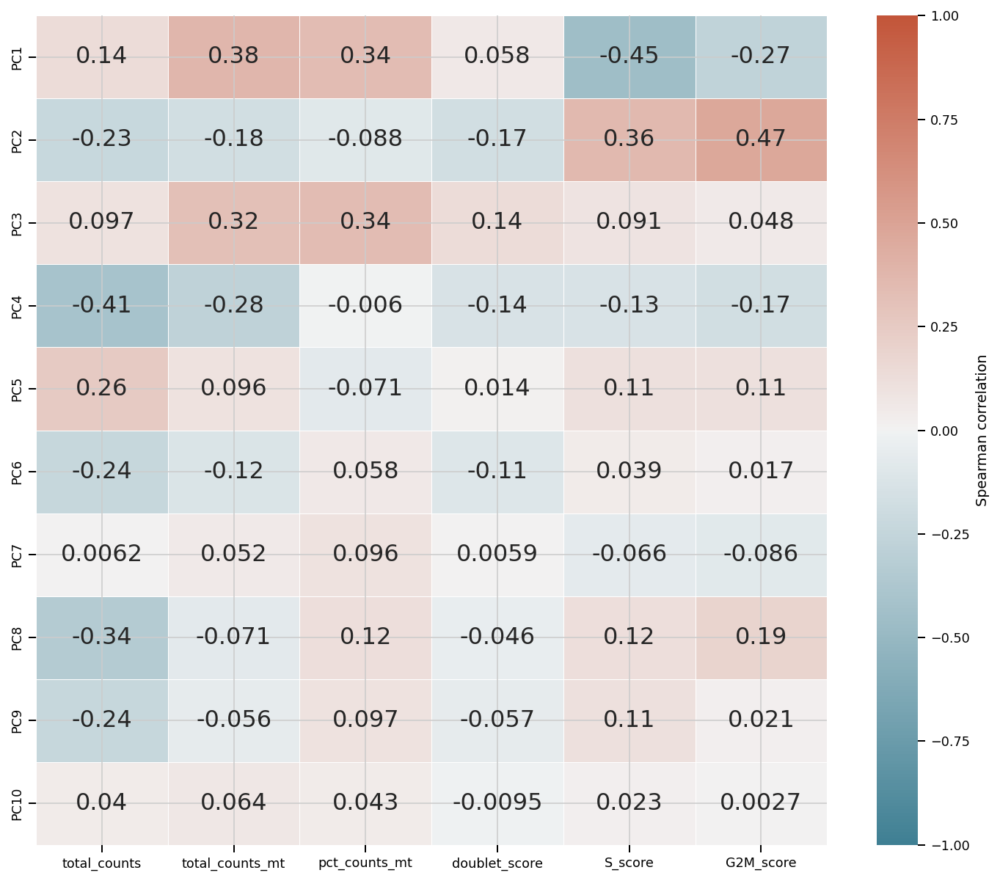

In [36]:
# Plot correlations with covariates
fig, ax = plt.subplots(figsize=(12, 10))
cmap = sns.diverging_palette(220, 20, as_cmap=True)
sns.heatmap(corr_df, annot=True, cmap=cmap, cbar_kws={'label': 'Spearman correlation'},
            linewidths=0.5, ax=ax, annot_kws={"size": 16},
            vmin=-1, vmax=1)
#plt.savefig(output_path.replace(".h5ad", "_pca_correlations.pdf"))

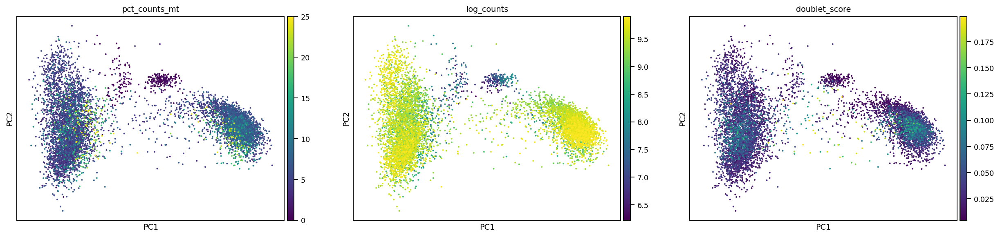

In [39]:
# Check technical covariates across first 2 PCs
with plt.rc_context():
    sc.pl.pca(adata_variable, color = ["pct_counts_mt", "log_counts", "doublet_score"], show=False)
    #plt.savefig(output_path.replace(".h5ad", "_technical_covariate_pca12.pdf"), dpi = 300, bbox_inches = "tight")

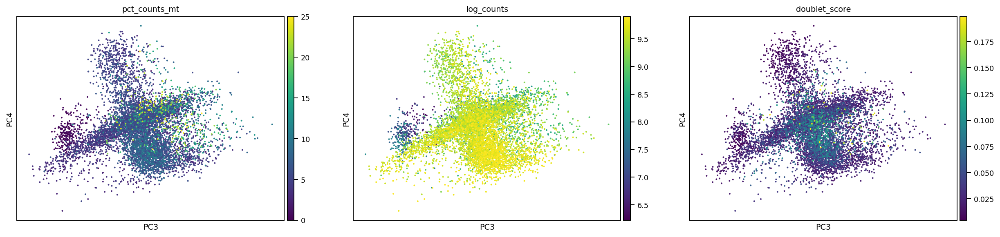

In [40]:
# Check technical covariates across first PCS 3 and 4
with plt.rc_context():
    sc.pl.pca(adata_variable, color = ["pct_counts_mt", "log_counts", "doublet_score"], dimensions=(2, 3))
    #plt.savefig(output_path.replace(".h5ad", "_technical_covariate_pca34.pdf"), dpi = 300, bbox_inches = "tight")

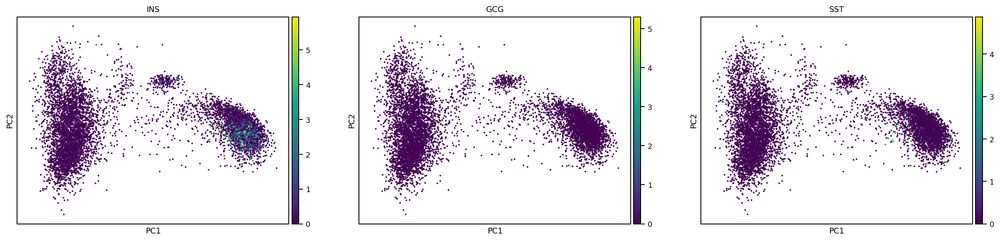

In [41]:
# Check for pancreatic islet cell markers
with plt.rc_context():
    sc.pl.pca(adata_variable, color = ["INS", "GCG", "SST"], show=False)
    #plt.savefig(output_path.replace(".h5ad", "_markers_pca.pdf"), dpi = 300, bbox_inches = "tight")

/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


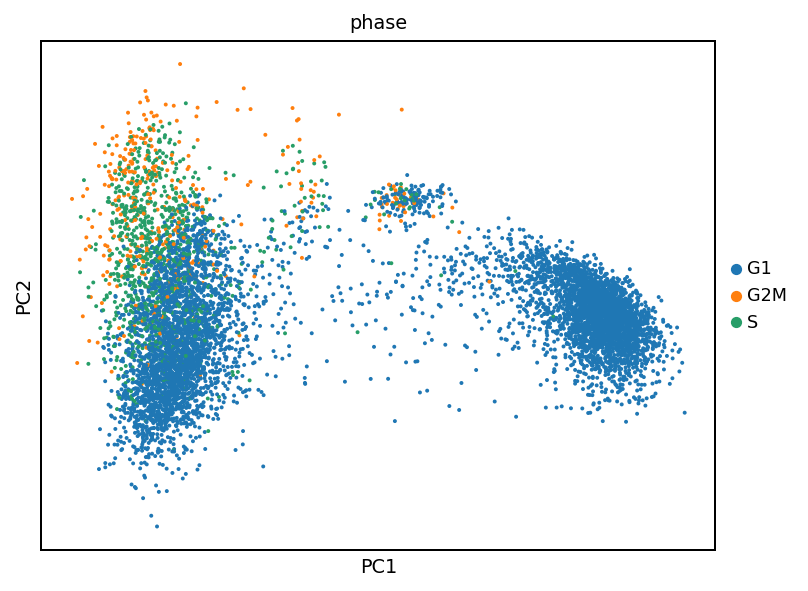

In [42]:
# Check for variance in biological covariates
with plt.rc_context():
    sc.pl.pca(adata_variable, color = ["phase"], show=False)
    #plt.savefig(output_path.replace(".h5ad", "_biological_covariates_pca.pdf"), dpi = 300, bbox_inches = "tight")

# UMAP

In [43]:
# Find neighbors
sc.pp.neighbors(adata_variable)

computing neighbors
    using 'X_pca' with n_pcs = 50


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/cellar/users/aklie/opt/mi

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)


In [44]:
# Calculate UMAP dimensionality reduction
sc.tl.umap(adata_variable)

computing UMAP


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


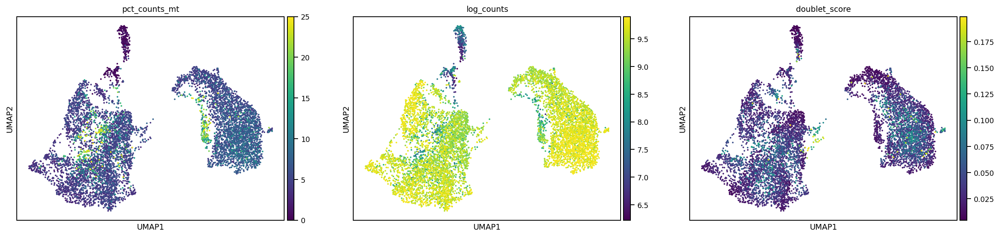

In [45]:
# Check technical covariates
with plt.rc_context():
    sc.pl.umap(adata_variable, color = ["pct_counts_mt", "log_counts", "doublet_score"])
    #plt.savefig(output_path.replace(".h5ad", "_technical_covariate_umap.pdf"), dpi = 300, bbox_inches = "tight")

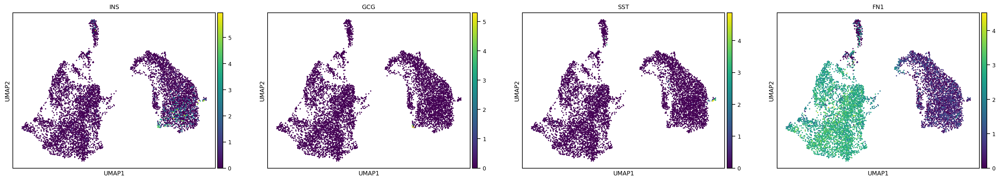

In [46]:
# Markers
with plt.rc_context():
    sc.pl.umap(adata_variable, color = ["INS", "GCG", "SST", "FN1"], use_raw=True)
    #plt.savefig(output_path.replace(".h5ad", "_markers_umap.pdf"), dpi = 300, bbox_inches = "tight")

/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


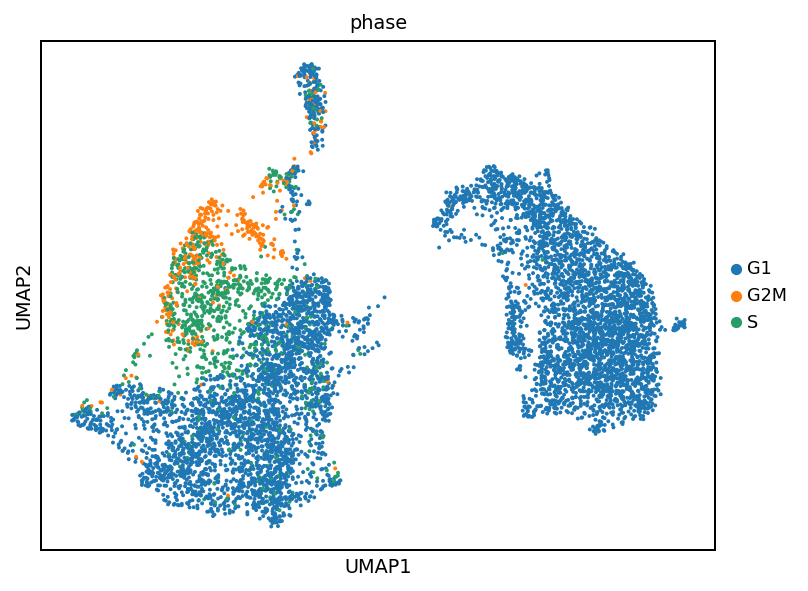

In [47]:
# Biological covariates
with plt.rc_context():
    sc.pl.umap(adata_variable, color = ["phase"])
    #plt.savefig(output_path.replace(".h5ad", "_biological_covariates_umap.pdf"), dpi = 300, bbox_inches = "tight")

# Clustering

In [54]:
# Cell clustering
sc.tl.leiden(adata_variable, random_state=random_state, resolution=1, key_added='leiden_r1')

running Leiden clustering
    finished: found 22 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:02)


In [55]:
# Try a bunch of different resolutions for leiden clustering
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.2, key_added='leiden_r0.2')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.1, key_added='leiden_r0.1')
sc.tl.leiden(adata_variable, random_state=random_state, resolution=0.05, key_added='leiden_r0.05')

running Leiden clustering
    finished: found 20 clusters and added
    'leiden_r0.8', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_r0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_r0.3', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_r0.2', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_r0.1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_r0.05', the cluster labels (adata.obs, categorical) (0:00:01)


In [56]:
# Check to see if clusters separate by sample
pd.crosstab(adata_variable.obs['sample'], adata_variable.obs['leiden_r1'])

leiden_r1,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
sample,,,,,,,,,,,,,,,,,,,,,
S1,959,0,1,3,1,3,0,0,0,0,...,0,0,0,17,7,0,0,0,0,0
S3,0,0,589,1,0,2,0,1,0,351,...,0,0,38,5,5,0,0,0,0,4
S4,1,5,8,10,6,6,2,408,7,1,...,6,0,80,53,50,7,5,1,2,6
S5_2D,0,1,0,545,93,0,209,0,1,0,...,100,0,1,8,6,17,0,0,0,0
S5_2D3D,0,1,0,6,446,1,217,2,0,0,...,101,0,0,6,5,39,1,0,0,1
S6_2D,0,394,0,2,3,323,1,1,128,1,...,1,9,1,18,9,6,58,41,1,0
S6_2D3D,3,327,1,1,6,173,3,1,244,0,...,1,132,0,4,15,27,12,10,39,1


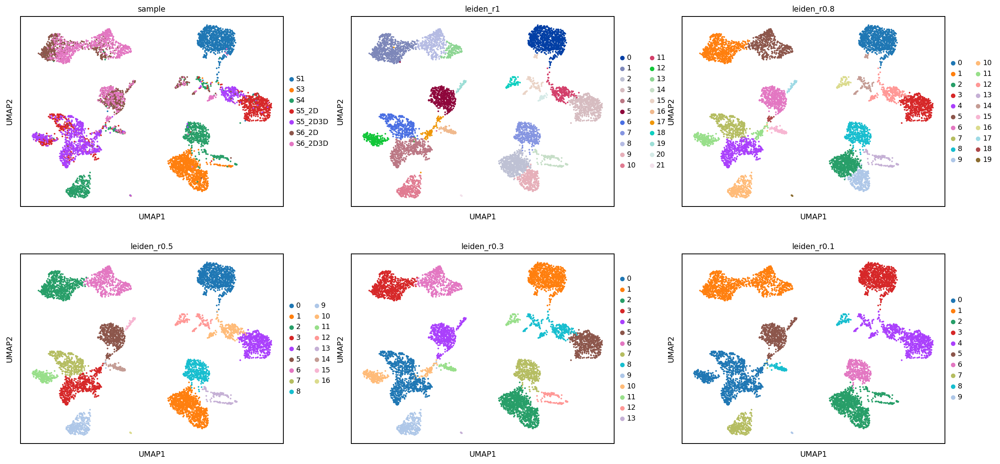

<Figure size 432x324 with 0 Axes>

In [57]:
# Plot umaps with clustering resolutions
with plt.rc_context():
    sc.pl.umap(adata_variable, color=['sample', 'leiden_r1', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.3', 'leiden_r0.1'], ncols=3)
    plt.savefig(output_path.replace(".h5ad", "_leiden_resolution_umap.pdf"), dpi = 300, bbox_inches = "tight")

In [58]:
# We can run PAGA on the leiden 1 resolution clustering to get at better connected clusters
sc.tl.paga(adata_variable, groups='leiden_r1')
sc.pl.paga(adata_variable, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_variable, init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


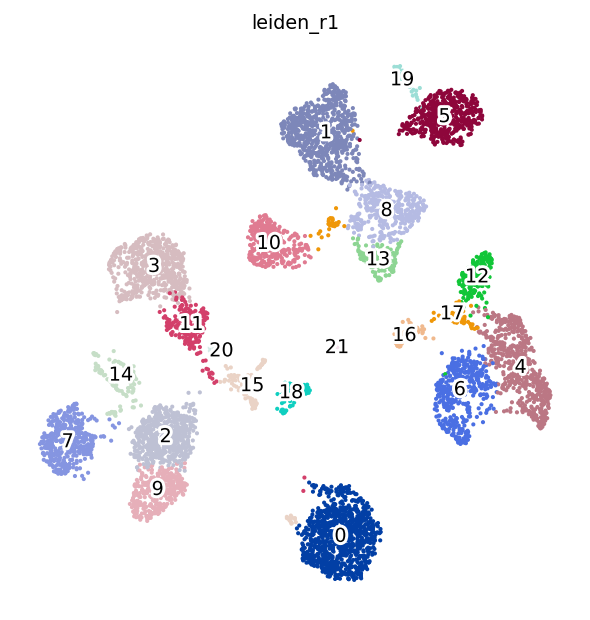

In [59]:
# Save the clustering results for leiden 1 resolution clustering
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(adata_variable, color=['leiden_r1'], ncols=3, legend_loc='on data', legend_fontoutline=3, legend_fontweight='normal', frameon=False, show=False)
    plt.savefig(output_path.replace(".h5ad", "_leiden_r1_paga_umap.pdf"), dpi = 300, bbox_inches = "tight")

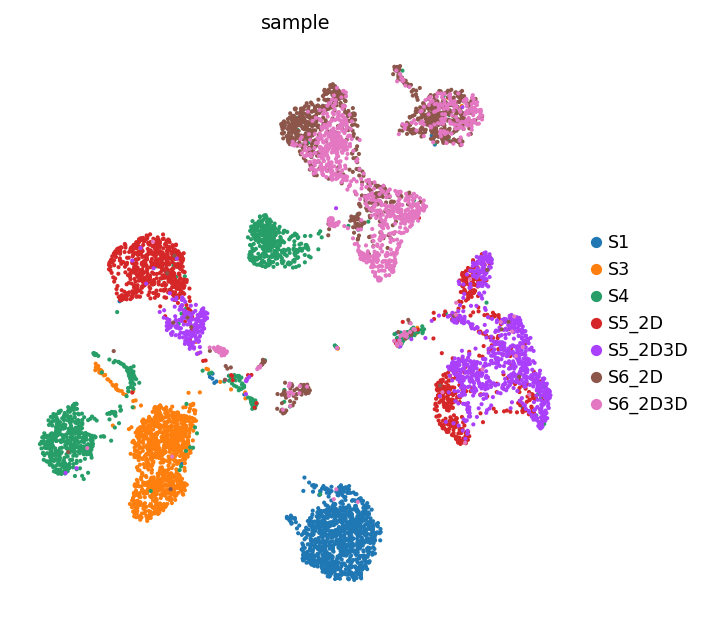

In [61]:
# Save with the sample annotated
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(adata_variable, color=['sample'], ncols=3, legend_fontoutline=3, legend_fontweight='normal', frameon=False, show=False)
    plt.savefig(output_path.replace(".h5ad", "_sample_paga_umap.pdf"), dpi = 300, bbox_inches = "tight")

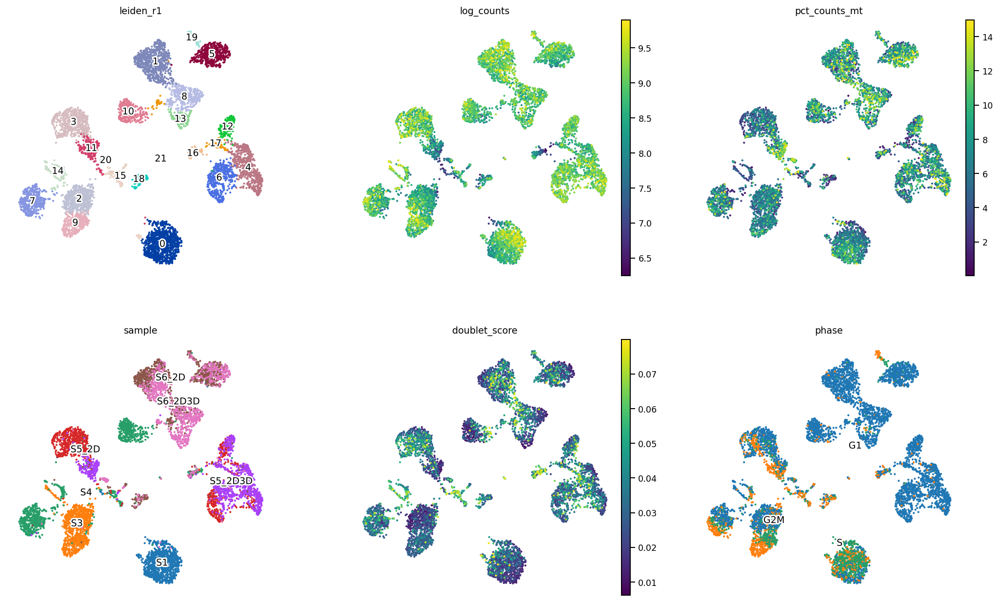

In [62]:
# Finally plot the UMAP with many of the annotations we have added to this point
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata_variable, 
        color=['leiden_r1', 'log_counts', 'pct_counts_mt', 'sample', 'doublet_score', 'phase'],
        ncols=3, 
        legend_loc='on data', 
        legend_fontoutline=3, 
        legend_fontweight='normal', 
        frameon=False, 
        show=False
    )
    plt.savefig(output_path.replace(".h5ad", "_important_covariates_paga_umap.pdf"), dpi = 300, bbox_inches = "tight")

# Marker gene analysis

In [63]:
# Perform the marker gene analysis using leiden_r1 clusters
sc.tl.rank_genes_groups(adata_variable, 'leiden_r1', method='t-test', n_genes=adata_variable.shape[1], use_raw=False, layer="log_normalized_counts")

ranking genes


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/pytho

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)


/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
/cellar/users/aklie/opt/miniconda3/envs/scverse-lite-py38/lib/python3.8/site

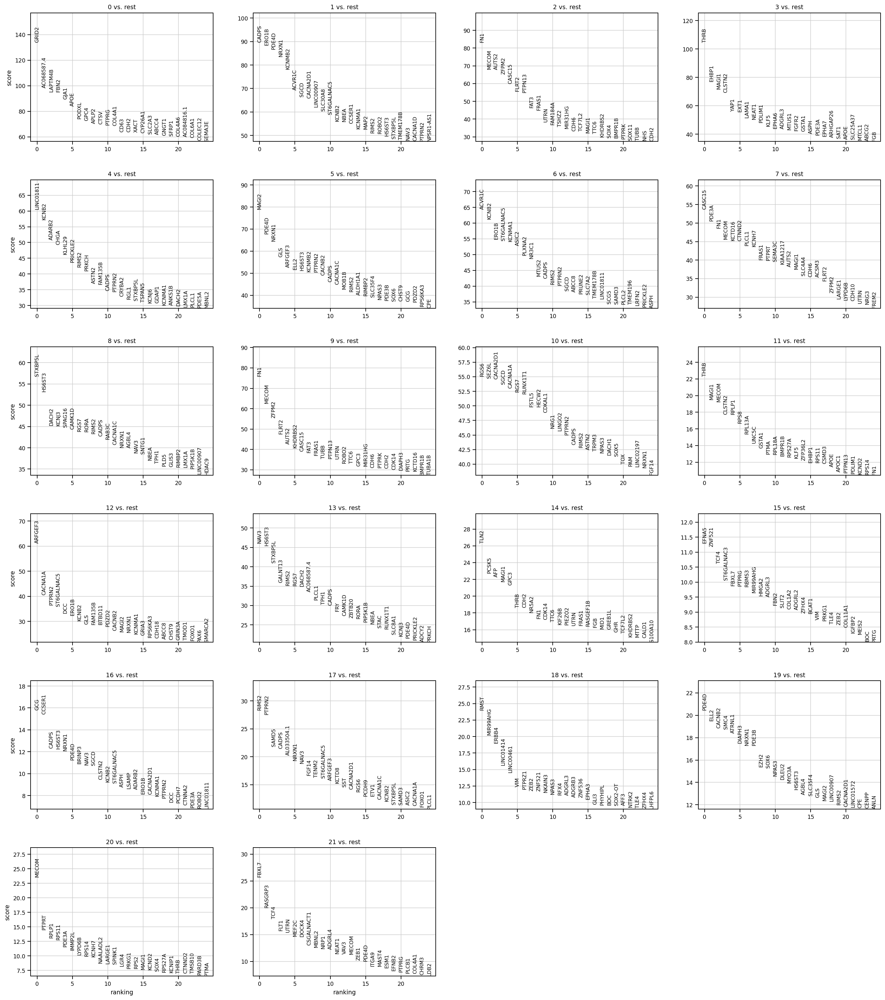

In [64]:
# Plot the top 10 genes for each cluster
with plt.rc_context():
    sc.pl.rank_genes_groups(adata_variable, n_genes=25, sharey=False, show=False)
    plt.savefig(output_path.replace(".h5ad", "_top25_markers.pdf"), dpi = 300, bbox_inches = "tight")

In [65]:
# Our last plot, another way of looking at marker genes!
markers = pd.DataFrame(adata_variable.uns['rank_genes_groups']['names'])
markers.to_csv(output_path.replace(".h5ad", "_markers.csv"), index=False)
markers.head(10).to_csv(output_path.replace(".h5ad", "_top10_markers.csv"), index=False)
markers.head(5)

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,GRID2,CADPS,FN1,THRB,LINC01811,MAGI2,ACVR1C,CASC15,STXBP5L,FN1,...,ARFGEF3,NAV3,TLN2,EFNA5,GCG,RIMS2,RMST,PDE4D,MECOM,FBXL7
1,AC068587.4,ERO1B,MECOM,EHBP1,KCNB2,PDE4D,KCNB2,PDE3A,HS6ST3,MECOM,...,CACNA1A,HS6ST3,PCSK5,ZNF521,CCSER1,PTPRN2,MIR99AHG,ELL2,PTPRT,RASGRP3
2,LAPTM4B,PDE4D,AUTS2,MAGI1,ADARB2,NRXN1,ERO1B,FN1,DACH2,ZFPM2,...,PTPRN2,STXBP5L,AFP,TCF4,CADPS,SAMD5,ERBB4,CACNB2,RPLP1,TCF4
3,FBN2,NRXN1,ZFPM2,CLSTN2,CHGA,GLS,ST6GALNAC5,MECOM,KCNJ3,FLRT2,...,ST6GALNAC5,GALNT13,MAGI1,ST6GALNAC3,HS6ST3,CADPS,LINC01414,SMC4,RPS11,FLT1
4,GJA1,KCNMB2,CASC15,YAP1,KLHL29,ARFGEF3,KCNMA1,KCTD16,SPAG16,AUTS2,...,DCC,RIMS2,GPC3,FBXL7,NRXN1,AL033504.1,LINC00461,ATRNL1,PDE3A,UTRN


In [66]:
# Get top 3 marker genes for each cluster and make a list for a dotplot
marker_genes = []
for cluster in markers.columns:
    marker_genes += list(markers[cluster].head(3).values)

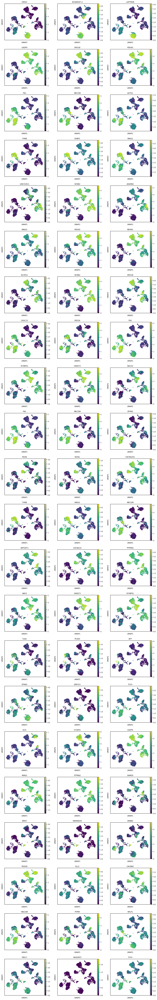

In [67]:
# We can replot the UMAP with several known markers for te PBMC cell types
with plt.rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(
        adata=adata_variable, 
        color=marker_genes,
        vmin='p20', 
        vmax='p99.9', 
        ncols=3,
        legend_loc='on data', 
        legend_fontoutline=3, 
        legend_fontweight='normal', 
        use_raw=False,
        layer="log_normalized_counts", 
        show=False
    )
    plt.savefig(output_path.replace(".h5ad", "_top3_markers_paga_umap.pdf"), dpi = 300, bbox_inches = "tight")

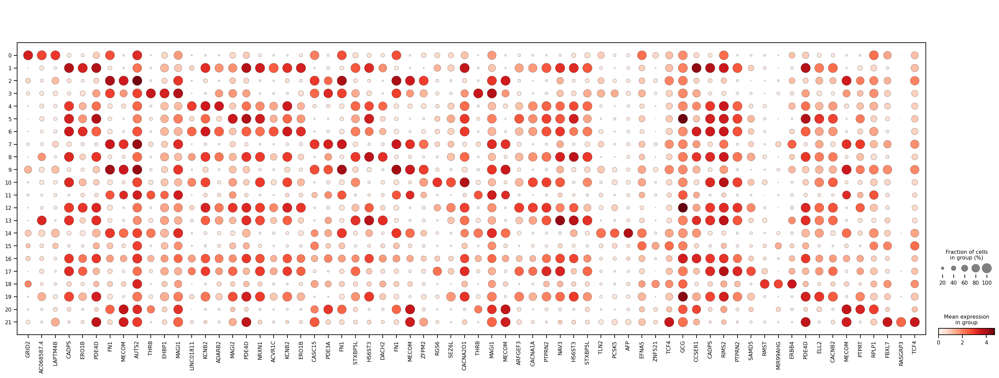

In [68]:
with plt.rc_context({'figure.figsize': (8, 4)}):
    sc.pl.dotplot(
        adata_variable,
        var_names=marker_genes,
        groupby="leiden_r1",
        use_raw=False,
        layer="log_normalized_counts",
        show=False,
    )
    plt.savefig(output_path.replace(".h5ad", "_top3_markers_dotplot.pdf"), dpi = 300, bbox_inches = "tight")

In [69]:
# Write a bunch of anndatas to capture different steps of the analysis
adata.write(output_path.replace(".h5ad", "_qc.h5ad"))
adata_filtered.write(output_path.replace(".h5ad", "_filtered.h5ad"))
adata_variable.write(output_path.replace(".h5ad", "_variable.h5ad"))

# Cluster annotation

In [ ]:
# Change the numbers to cell type names
new_cluster_names = {
    "0": "Stage 3",
    "1": "Stage 1",
    "2": "",
    "3": "",
    "4": "",
    "5": "",
    "6": "",
    "7": "",
    "8": "",
    "9": "",
    "10": "",
    "11": "",
    "12": "",
    "13": "",
    "14": "",
    "15": "",
    "16": "",
    "17": "",
    "18": "",
    "19": "",
    "20": "",
}

# DONE!


---

# Scratch